In [ ]:
%pip install pandas
%pip install matplotlib
%pip install seaborn
%pip install statsmodels

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

In [3]:
def load_and_clean_data(file_path):
    df = pd.read_csv(file_path)
    
    df.dropna(subset=['Data_Value', 'YearStart', 'YearEnd', 'LocationDesc', 'Question', 'Topic', 'Sample_Size'], inplace=True)
    
    df['YearStart'] = df['YearStart'].astype(int)
    df['YearEnd'] = df['YearEnd'].astype(int)
    df['Data_Value'] = pd.to_numeric(df['Data_Value'], errors='coerce')
    df['Sample_Size'] = pd.to_numeric(df['Sample_Size'], errors='coerce')
    df = df[['YearStart', 'LocationDesc', 'Topic', 'Question', 'Data_Value', 'Sample_Size']]

    return df

file_path = 'Nutrition_Physical_Activity_and_Obesity_Data.csv' 
df = load_and_clean_data(file_path)

df

/var/folders/1x/443khrvj3wxbl0fy_v6jmhjh0000gn/T/ipykernel_80807/845931403.py:2: DtypeWarning: Columns (18,19,21,22) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


,YearStart,LocationDesc,Topic,Question,Data_Value,Sample_Size
0,2019,Alaska,Physical Activity - Behavior,Percent of students in grades 9-12 who achieve...,9.6,130.0
1,2019,Arizona,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,13.3,1739.0
2,2019,District of Columbia,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,17.1,8978.0
3,2019,Illinois,Physical Activity - Behavior,Percent of students in grades 9-12 who partici...,65.9,876.0
4,2019,Maryland,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,16.7,2573.0
...,...,...,...,...,...,...
133340,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,24.5,111.0
133341,2022,Wyoming,Physical Activity - Behavior,Percent of adults who engage in no leisure-tim...,36.0,159.0
133342,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,35.2,450.0
133343,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,35.3,512.0


In [4]:
topic = 'Obesity / Weight Status'  

In [5]:
topic_df = df[df['Topic'] == topic]
    
topic_df

,YearStart,LocationDesc,Topic,Question,Data_Value,Sample_Size
1,2019,Arizona,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,13.3,1739.0
2,2019,District of Columbia,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,17.1,8978.0
4,2019,Maryland,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,16.7,2573.0
5,2011,Rhode Island,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,11.5,1199.0
6,2019,Montana,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,12.2,1045.0
...,...,...,...,...,...,...
133339,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,37.3,663.0
133340,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,24.5,111.0
133342,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,35.2,450.0
133343,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,35.3,512.0


In [6]:
questions = topic_df['Question'].unique()

questions

array(['Percent of students in grades 9-12 who have obesity',
       'Percent of students in grades 9-12 who have an overweight classification',
       'Percent of adults aged 18 years and older who have obesity',
       'Percent of adults aged 18 years and older who have an overweight classification'],
      dtype=object)

In [7]:
question1_df = topic_df[topic_df['Question'] == 'Percent of students in grades 9-12 who have obesity']
question1_df


,YearStart,LocationDesc,Topic,Question,Data_Value,Sample_Size
1,2019,Arizona,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,13.3,1739.0
2,2019,District of Columbia,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,17.1,8978.0
5,2011,Rhode Island,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,11.5,1199.0
6,2019,Montana,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,12.2,1045.0
7,2019,Nebraska,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,10.3,649.0
...,...,...,...,...,...,...
40026,2003,North Carolina,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,8.1,1242.0
40050,2013,North Carolina,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,8.4,866.0
40064,2013,Alaska,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,21.2,113.0
40073,2005,Wyoming,Obesity / Weight Status,Percent of students in grades 9-12 who have ob...,7.6,677.0


In [8]:
question2_df = topic_df[topic_df['Question'] == 'Percent of students in grades 9-12 who have an overweight classification']
question2_df


,YearStart,LocationDesc,Topic,Question,Data_Value,Sample_Size
4,2019,Maryland,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,16.7,2573.0
8,2019,New Mexico,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,16.7,4723.0
15,2017,Vermont,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,14.1,18504.0
17,2019,West Virginia,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,16.2,1066.0
29,2017,Guam,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,20.9,279.0
...,...,...,...,...,...,...
40063,2001,Idaho,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,10.9,477.0
40068,2013,Vermont,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,14.7,2950.0
40081,2001,Vermont,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,10.7,3359.0
40084,2011,Virginia,Obesity / Weight Status,Percent of students in grades 9-12 who have an...,21.8,188.0


In [9]:
question3_df = topic_df[topic_df['Question'] == 'Percent of adults aged 18 years and older who have obesity']
question3_df


,YearStart,LocationDesc,Topic,Question,Data_Value,Sample_Size
40097,2014,Guam,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,29.3,842.0
40098,2013,National,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,28.8,62562.0
40103,2012,District of Columbia,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,31.6,243.0
40105,2011,Alabama,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,35.2,598.0
40108,2011,National,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,35.4,6649.0
...,...,...,...,...,...,...
133329,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,39.0,305.0
133333,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,35.7,959.0
133334,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,32.8,3356.0
133342,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,35.2,450.0


In [10]:
question4_df = topic_df[topic_df['Question'] == 'Percent of adults aged 18 years and older who have an overweight classification']
question4_df

,YearStart,LocationDesc,Topic,Question,Data_Value,Sample_Size
40099,2013,National,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,32.7,60069.0
40102,2012,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,48.5,69.0
40107,2015,Rhode Island,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,40.2,354.0
40117,2012,National,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,35.1,120032.0
40120,2015,Puerto Rico,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,42.0,997.0
...,...,...,...,...,...,...
133328,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,41.5,722.0
133331,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,38.0,1860.0
133339,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,37.3,663.0
133340,2022,Wyoming,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,24.5,111.0


## Compute National & State 

In [11]:
def weighted_average(df, value_column, weight_column):
    return (df[value_column] * df[weight_column]).sum() / df[weight_column].sum()

grouped1_df = question1_df.groupby(['YearStart', 'LocationDesc']).apply(lambda x: pd.Series({
            'Weighted_Data_Value': weighted_average(x, 'Data_Value', 'Sample_Size')
            })).reset_index()
grouped2_df = question2_df.groupby(['YearStart', 'LocationDesc']).apply(lambda x: pd.Series({
            'Weighted_Data_Value': weighted_average(x, 'Data_Value', 'Sample_Size')
            })).reset_index()
grouped3_df = question3_df.groupby(['YearStart', 'LocationDesc']).apply(lambda x: pd.Series({
            'Weighted_Data_Value': weighted_average(x, 'Data_Value', 'Sample_Size')
            })).reset_index()
grouped4_df = question4_df.groupby(['YearStart', 'LocationDesc']).apply(lambda x: pd.Series({
            'Weighted_Data_Value': weighted_average(x, 'Data_Value', 'Sample_Size')
            })).reset_index()

grouped1_df

/var/folders/1x/443khrvj3wxbl0fy_v6jmhjh0000gn/T/ipykernel_80807/2107223201.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped1_df = question1_df.groupby(['YearStart', 'LocationDesc']).apply(lambda x: pd.Series({
/var/folders/1x/443khrvj3wxbl0fy_v6jmhjh0000gn/T/ipykernel_80807/2107223201.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped2_df = question2_df.groupby(['YearStart', 'LocationDe

,YearStart,LocationDesc,Weighted_Data_Value
0,2001,Alabama,12.140542
1,2001,Arkansas,13.350048
2,2001,Delaware,10.683654
3,2001,Florida,10.082697
4,2001,Idaho,7.147514
...,...,...,...
396,2019,Utah,9.623648
397,2019,Vermont,12.992641
398,2019,Virginia,14.736071
399,2019,West Virginia,22.612062


In [16]:
national1_df = grouped1_df[grouped1_df['LocationDesc'] == 'National']
national1_df

,YearStart,LocationDesc,Weighted_Data_Value
11,2001,National,10.777437
38,2003,National,12.199633
76,2005,National,13.139717
119,2007,National,13.075449
161,2009,National,11.931245
205,2011,National,13.146012
247,2013,National,13.782396
291,2015,National,13.943990
333,2017,National,14.863031
378,2019,National,15.455182


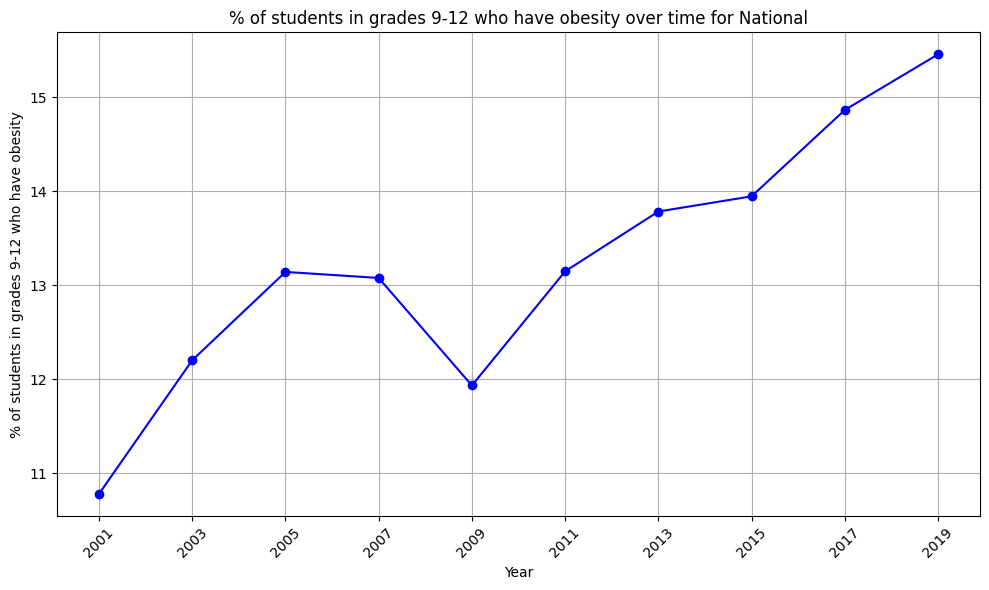

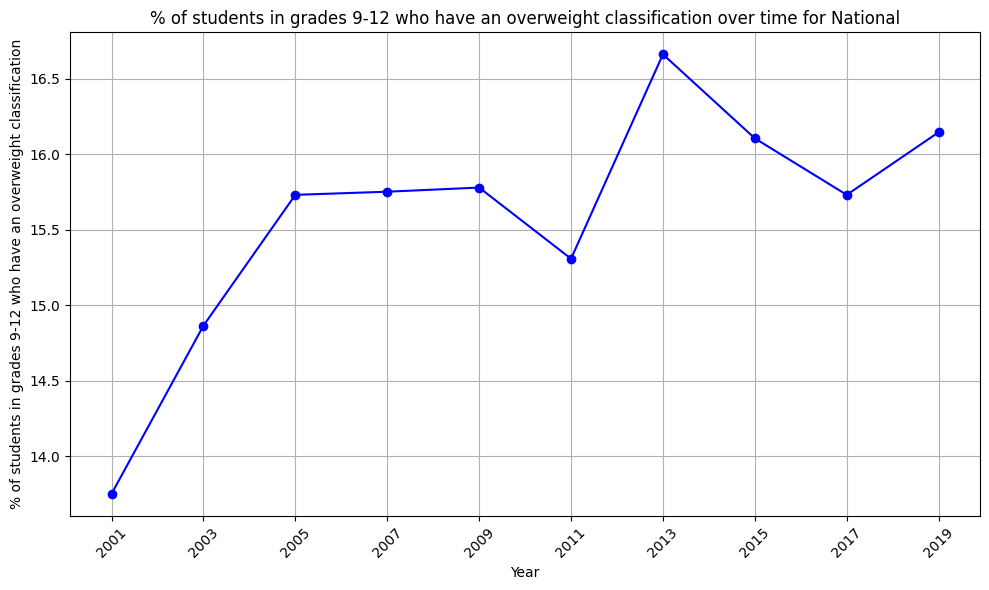

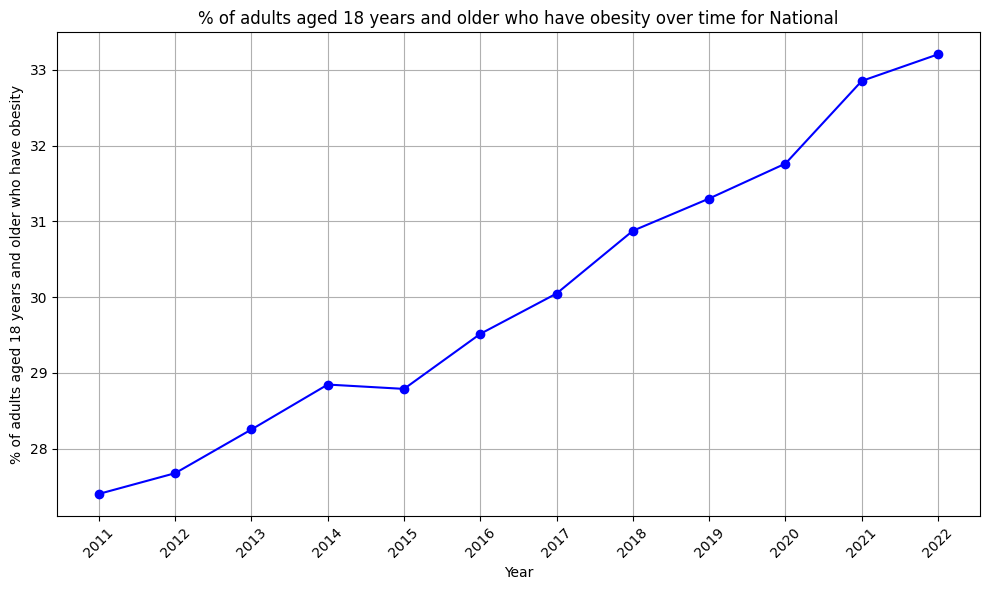

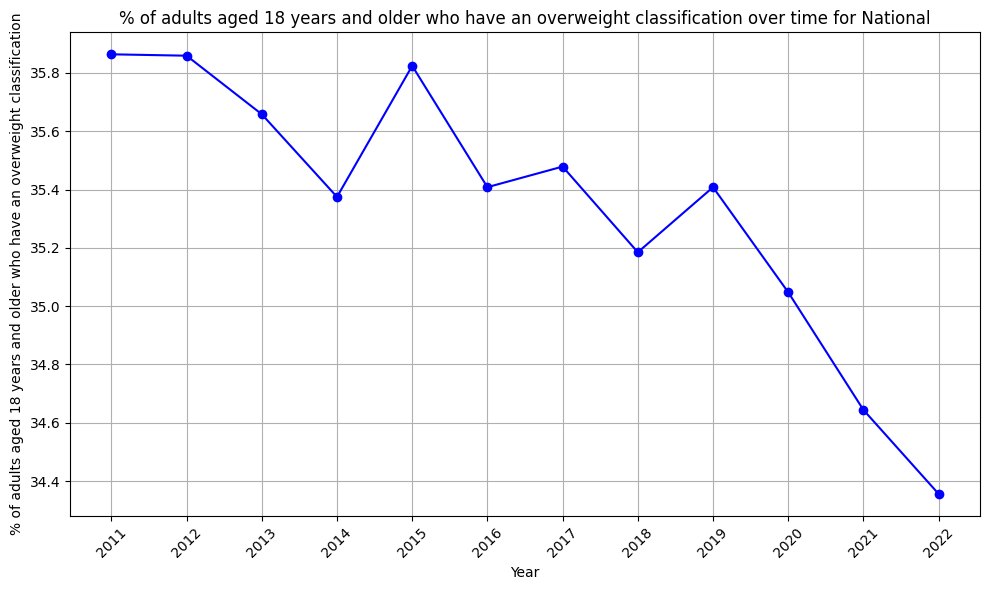

In [17]:
national2_df = grouped2_df[grouped2_df['LocationDesc'] == 'National']
national3_df = grouped3_df[grouped3_df['LocationDesc'] == 'National']
national4_df = grouped4_df[grouped4_df['LocationDesc'] == 'National']


def plot(df, question):

    plt.figure(figsize=(10, 6))
    plt.plot(df["YearStart"], df["Weighted_Data_Value"], marker='o', linestyle='-', color='b')
    plt.title(f"{question} over time for {df['LocationDesc'].iloc[0]}")
    plt.xlabel("Year")
    plt.ylabel(question)
    plt.grid(True)
    plt.xticks(df["YearStart"], rotation=45)
    plt.tight_layout()

    # Show plot
    plt.show()

plot(national1_df, '% of students in grades 9-12 who have obesity')
plot(national2_df, '% of students in grades 9-12 who have an overweight classification')
plot(national3_df, '% of adults aged 18 years and older who have obesity')
plot(national4_df, '% of adults aged 18 years and older who have an overweight classification')

## Generate Charts for Each State

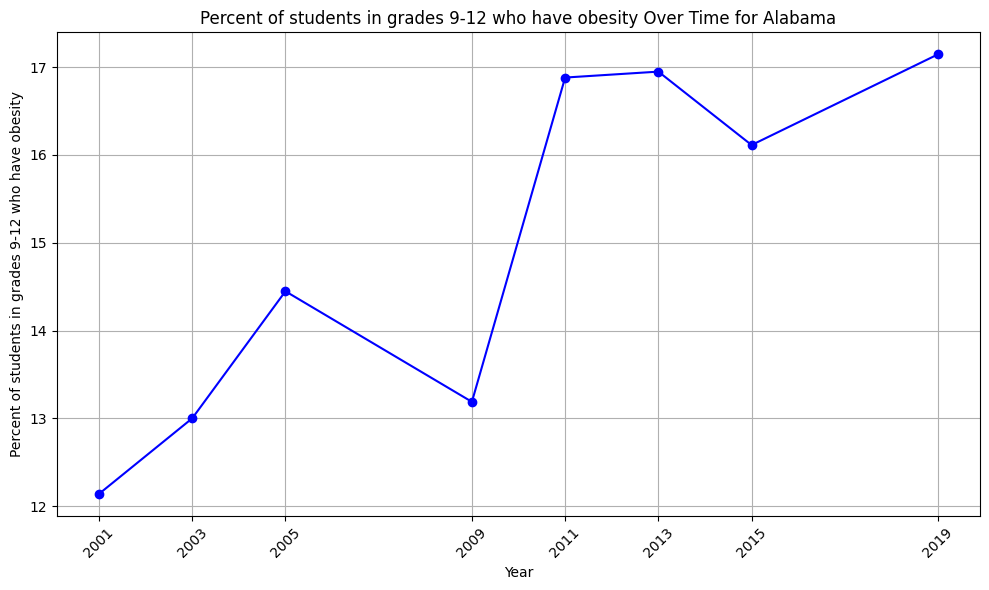

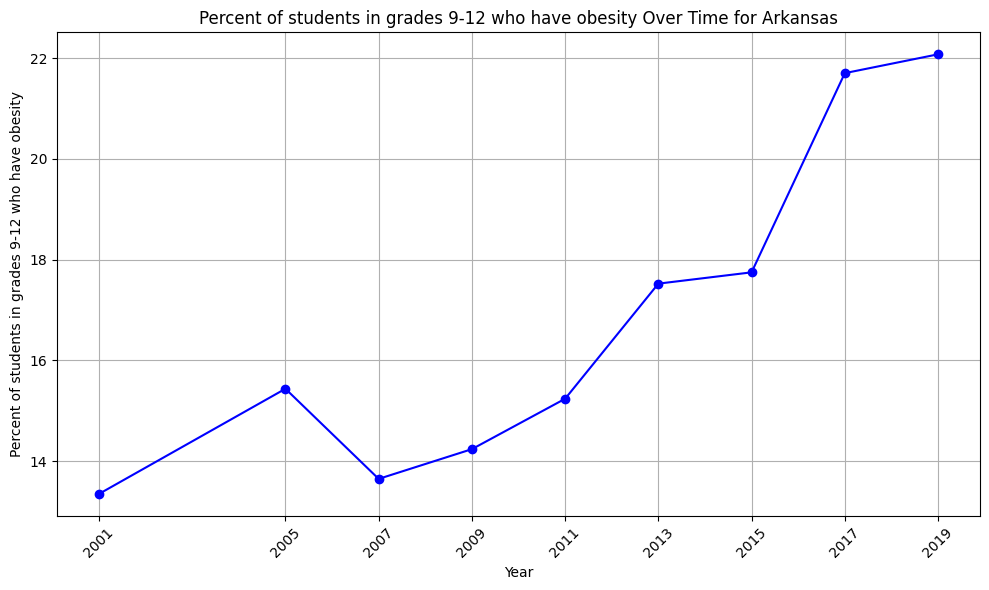

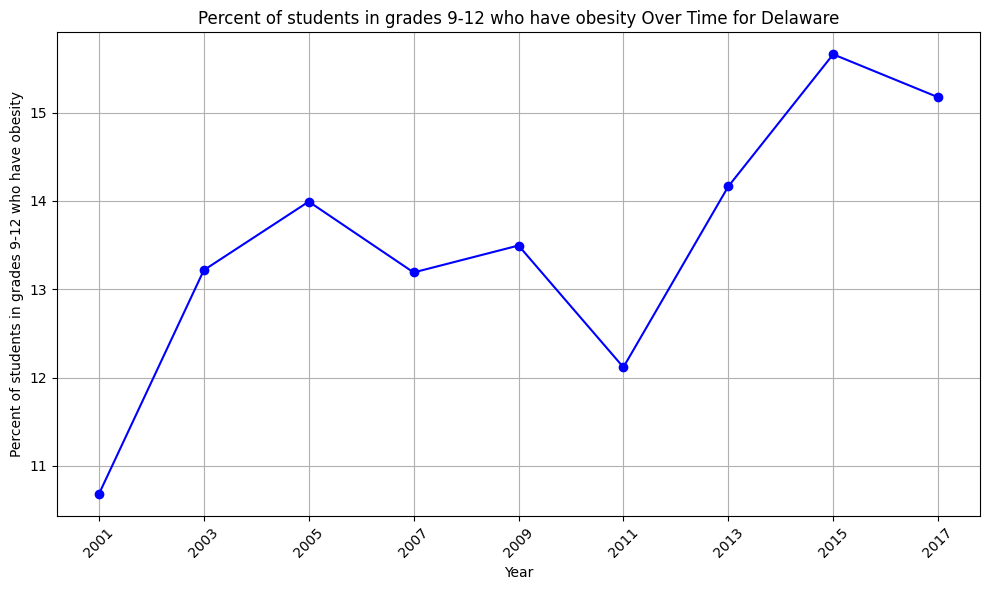

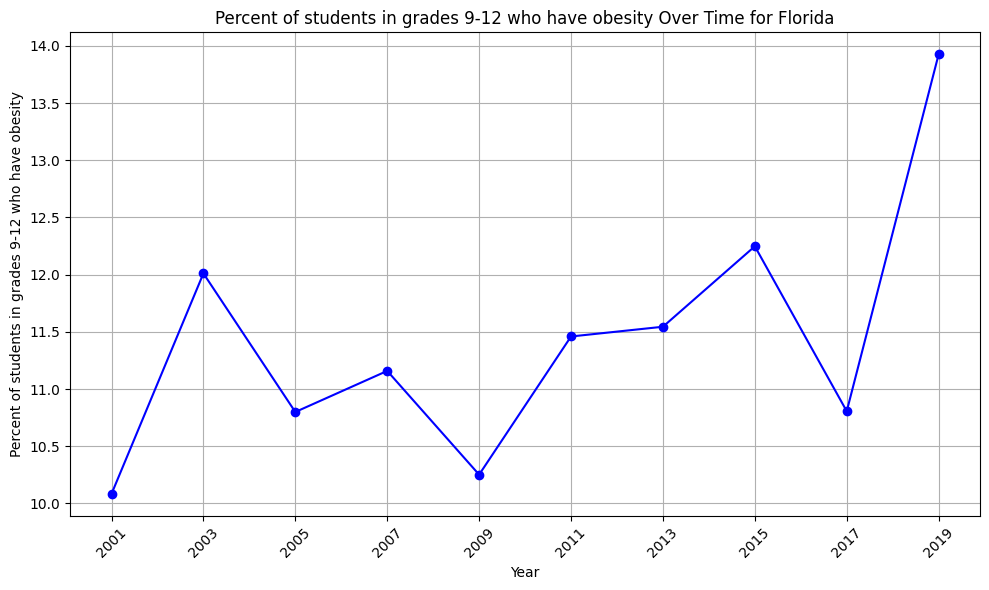

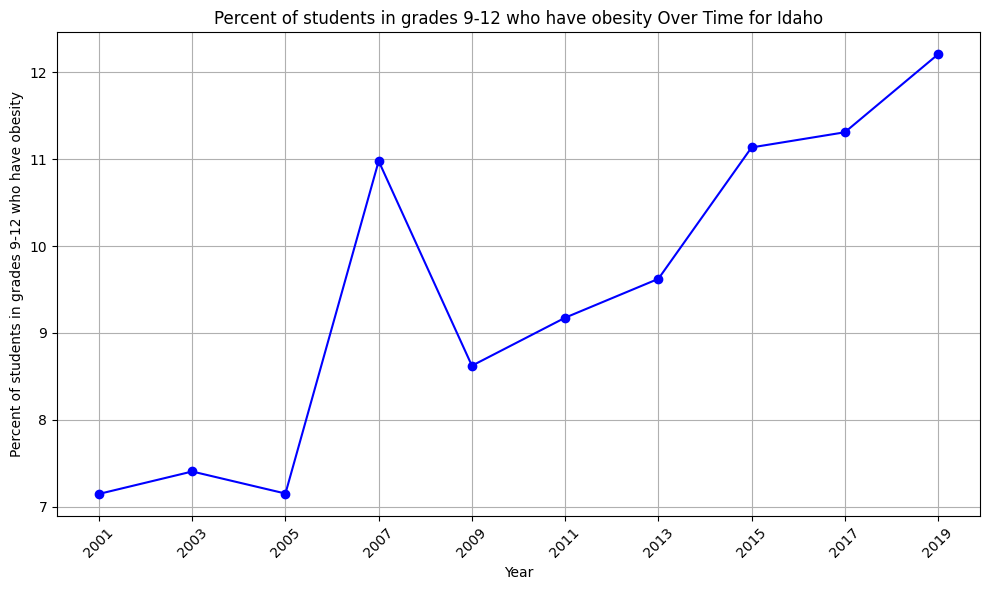

...

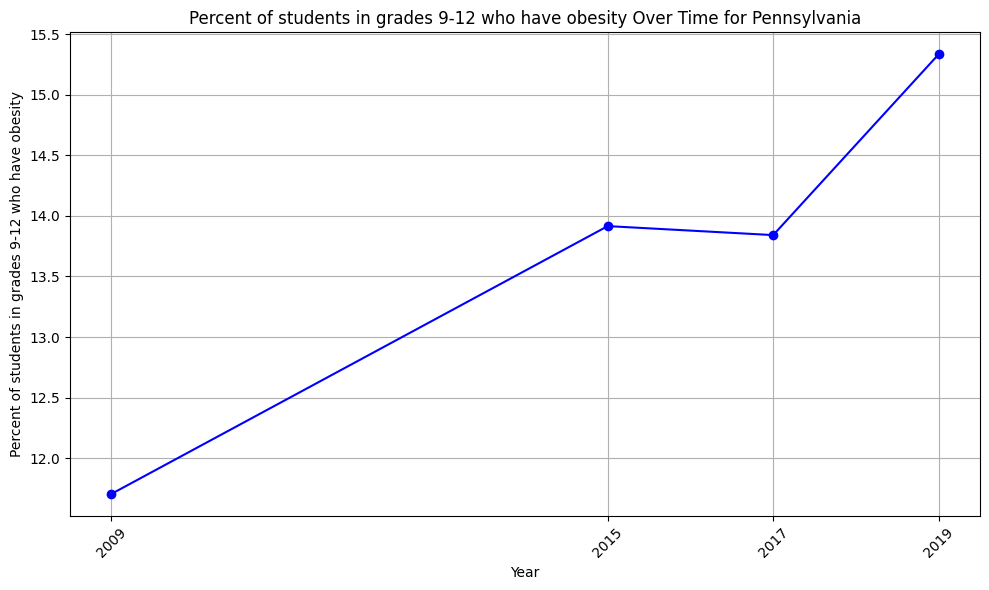

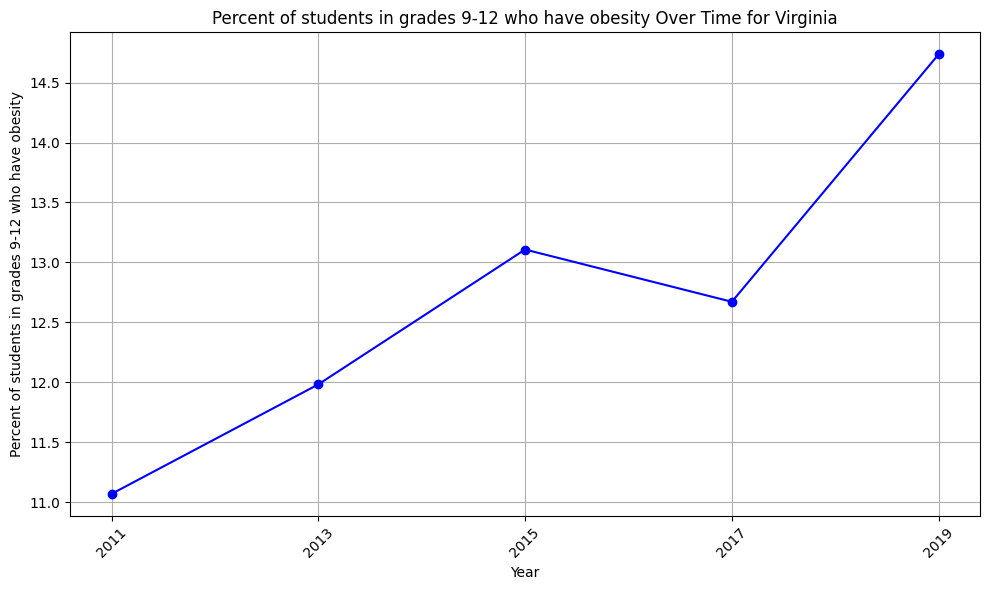

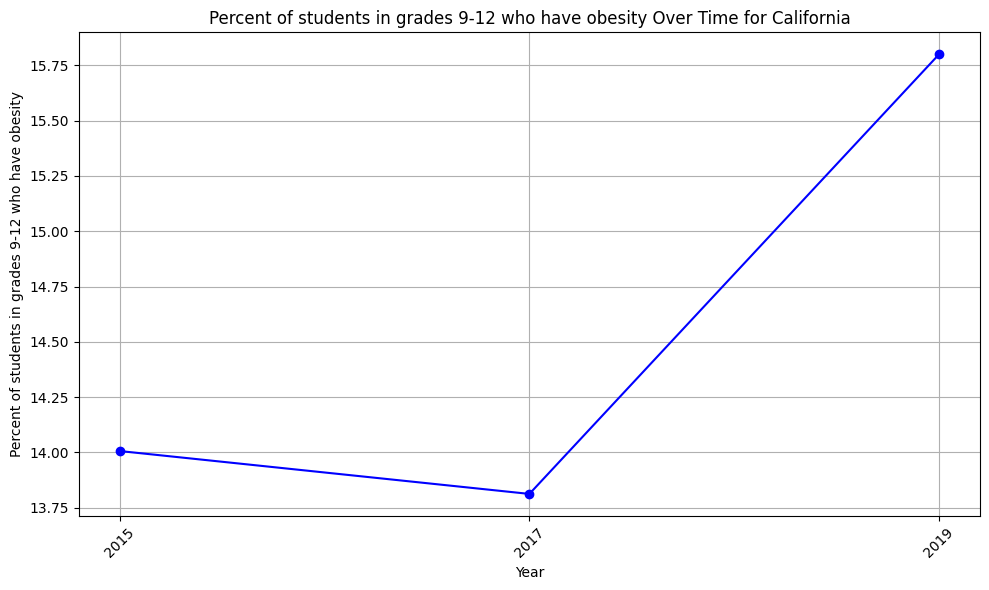

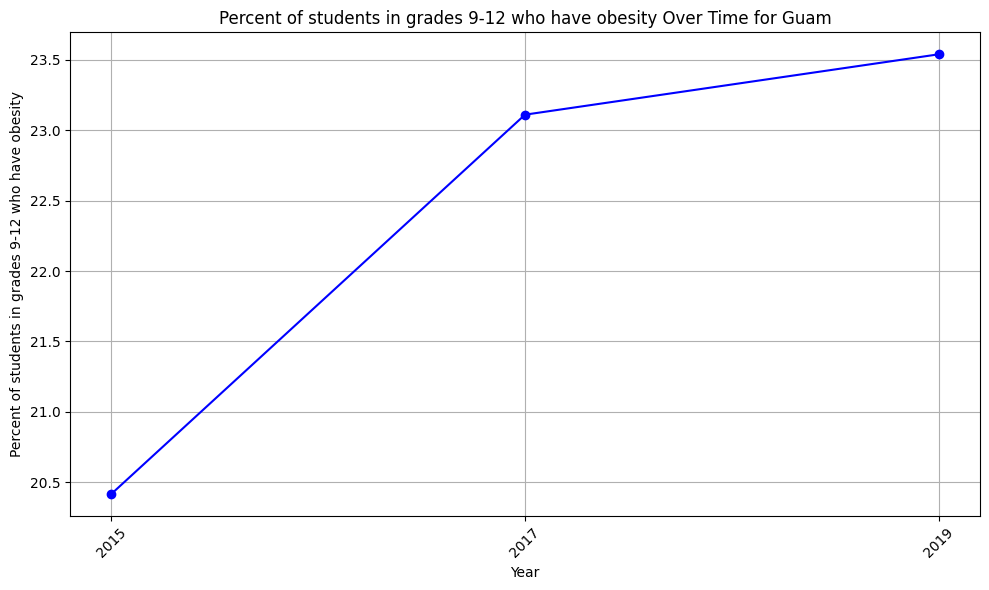

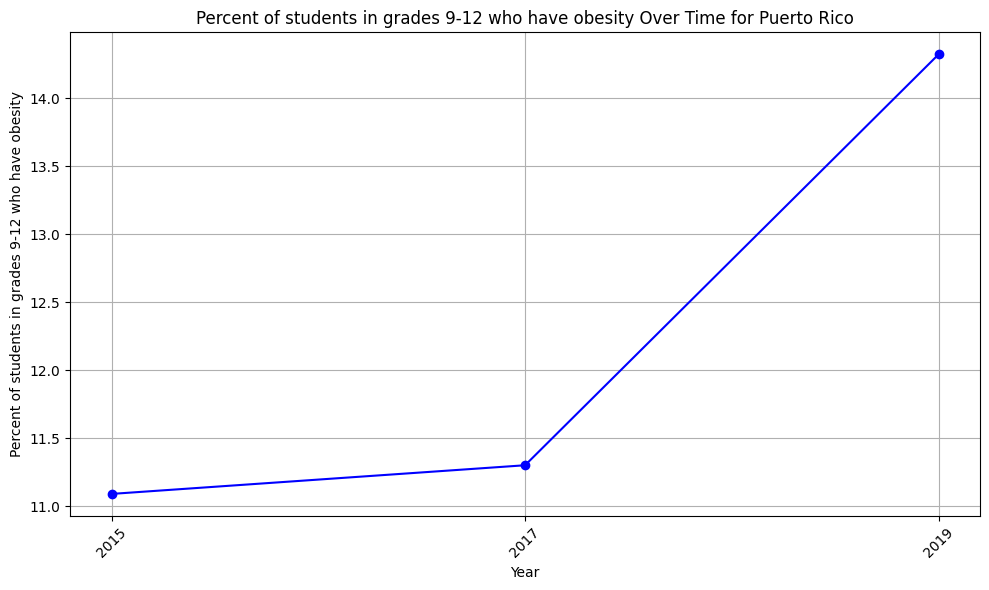

In [41]:
def plot_for_all_states(grouped_df, question):
    states = grouped_df['LocationDesc'].unique()
    for state in states:
        state_df = grouped_df[grouped_df['LocationDesc'] == state]
        plot(state_df, question)

plot_for_all_states(grouped1_df, 'Percent of students in grades 9-12 who have obesity')

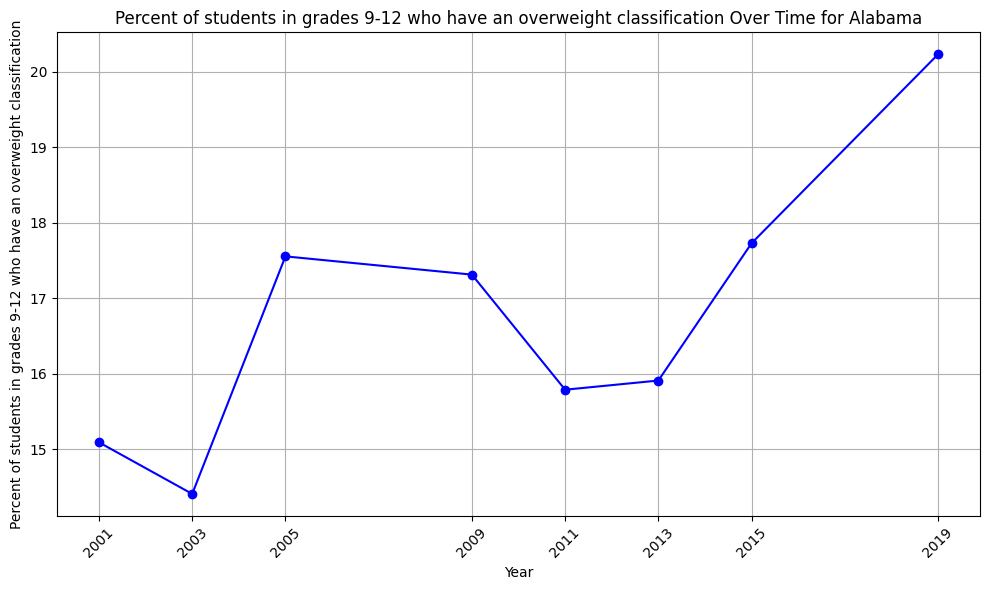

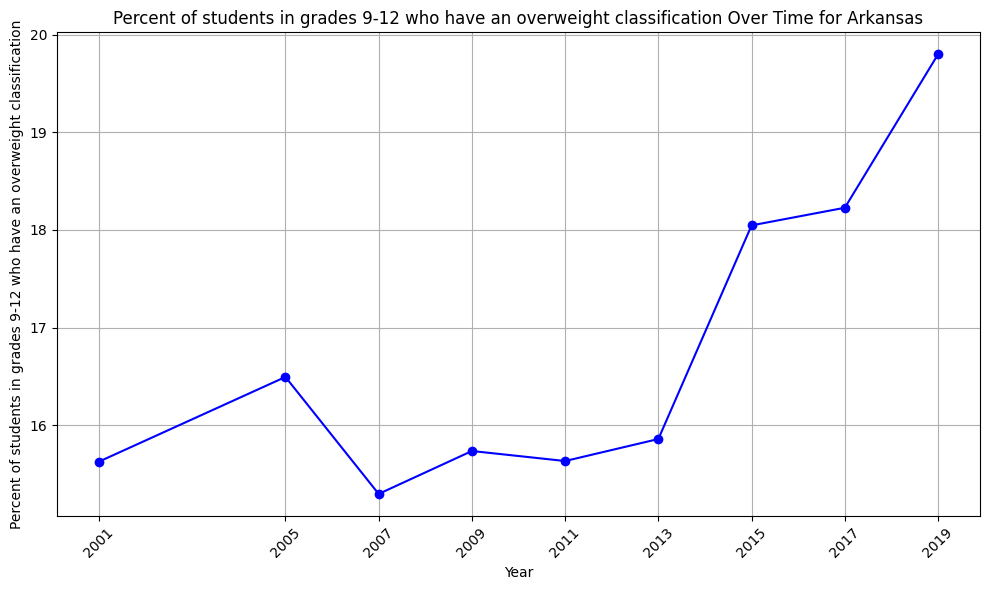

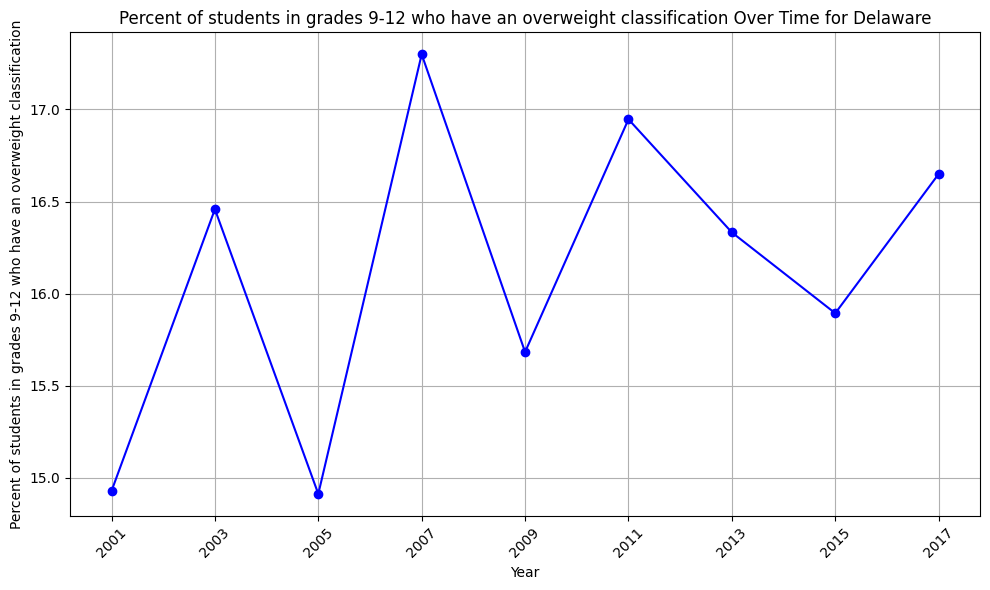

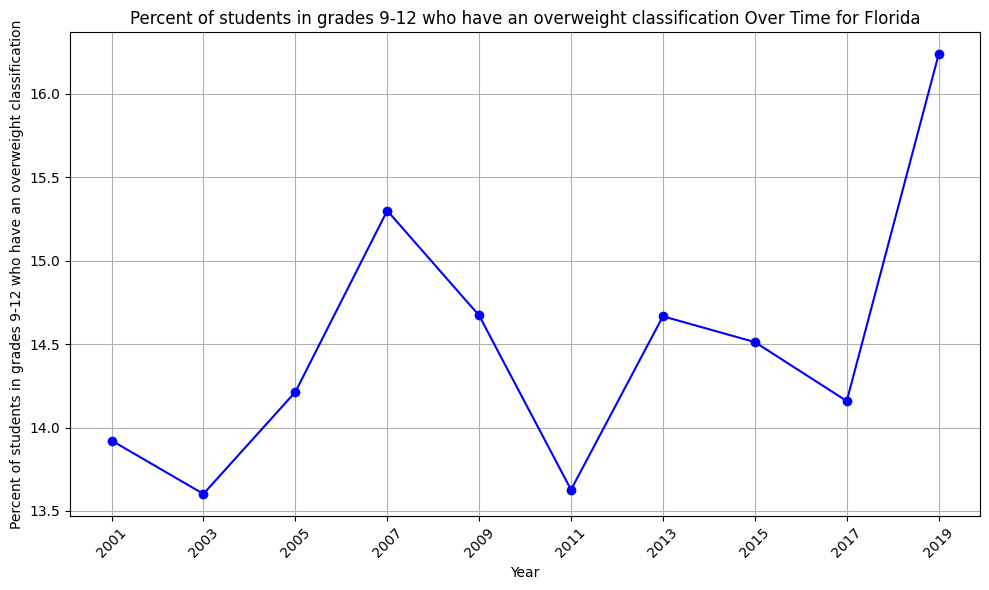

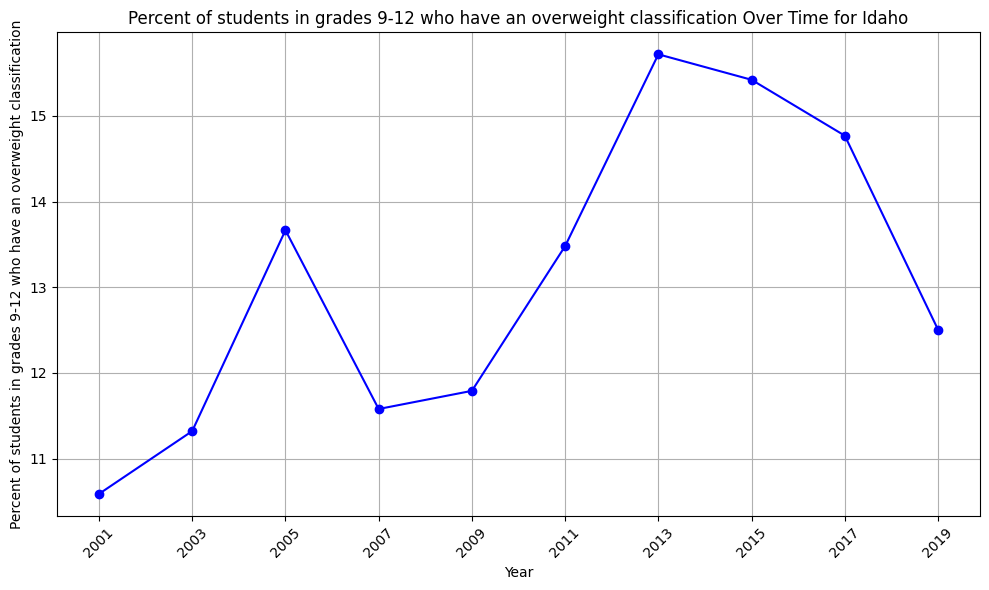

...

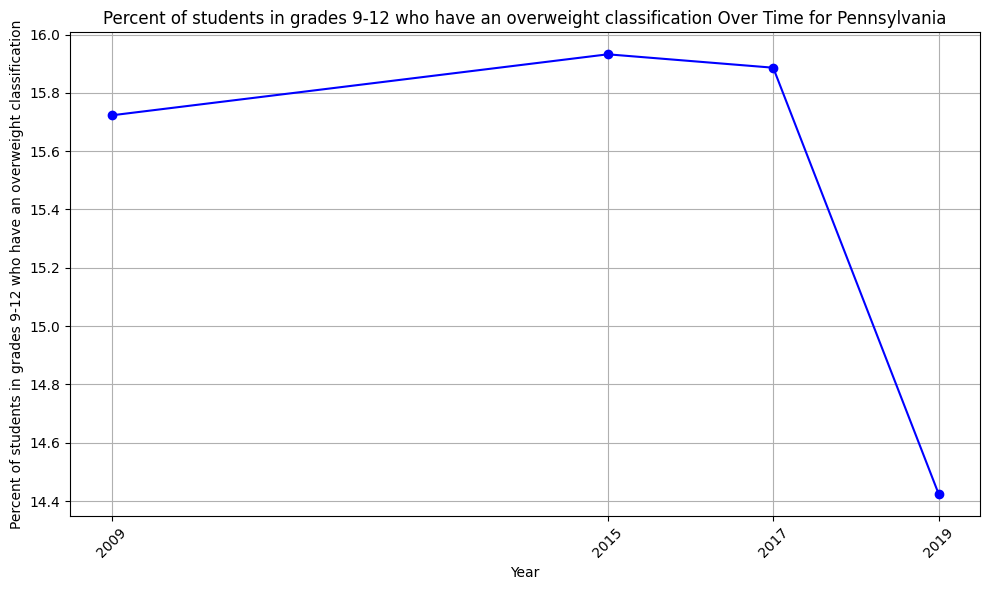

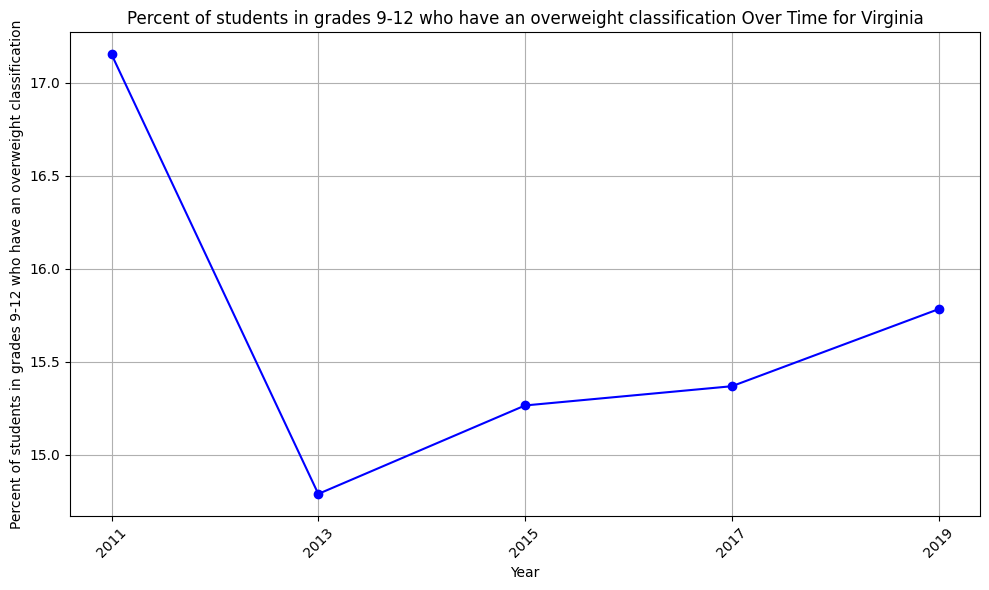

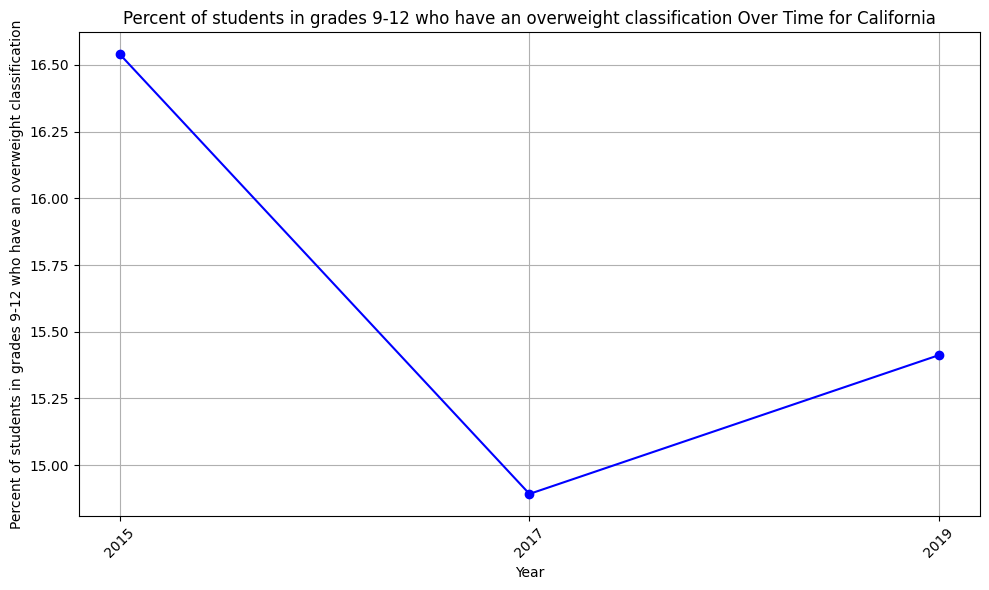

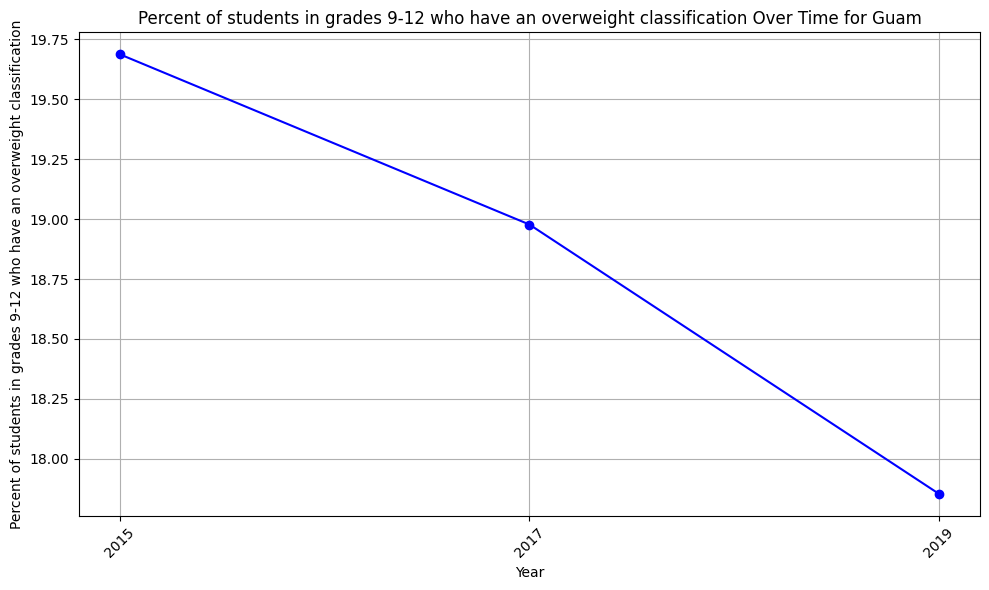

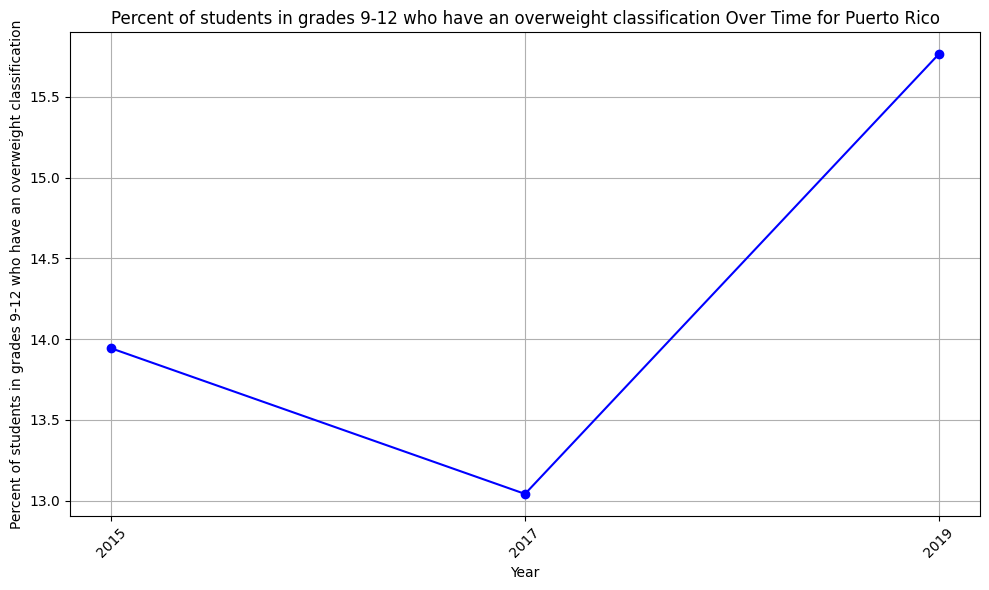

In [42]:
plot_for_all_states(grouped2_df, 'Percent of students in grades 9-12 who have an overweight classification')

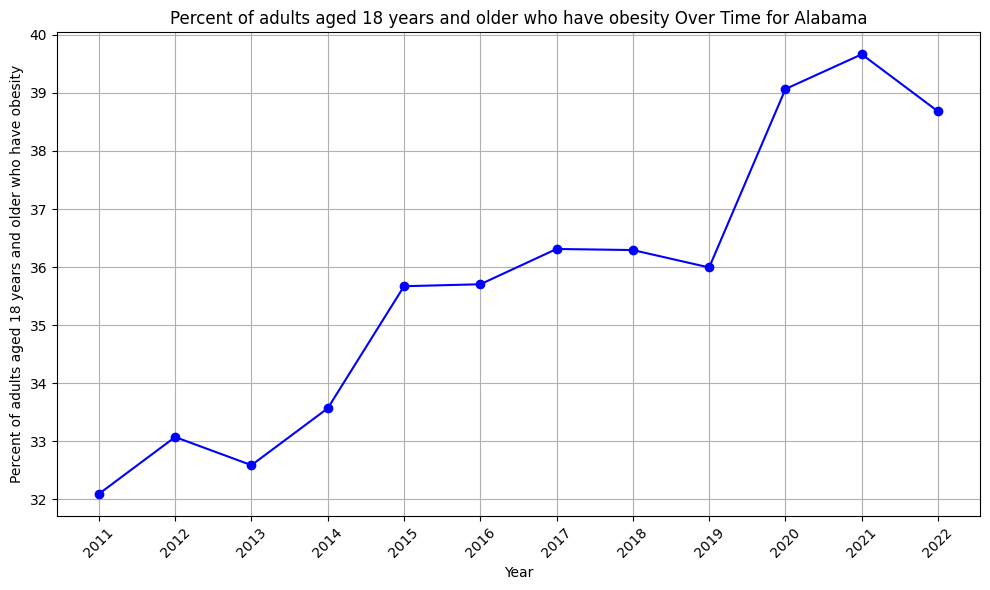

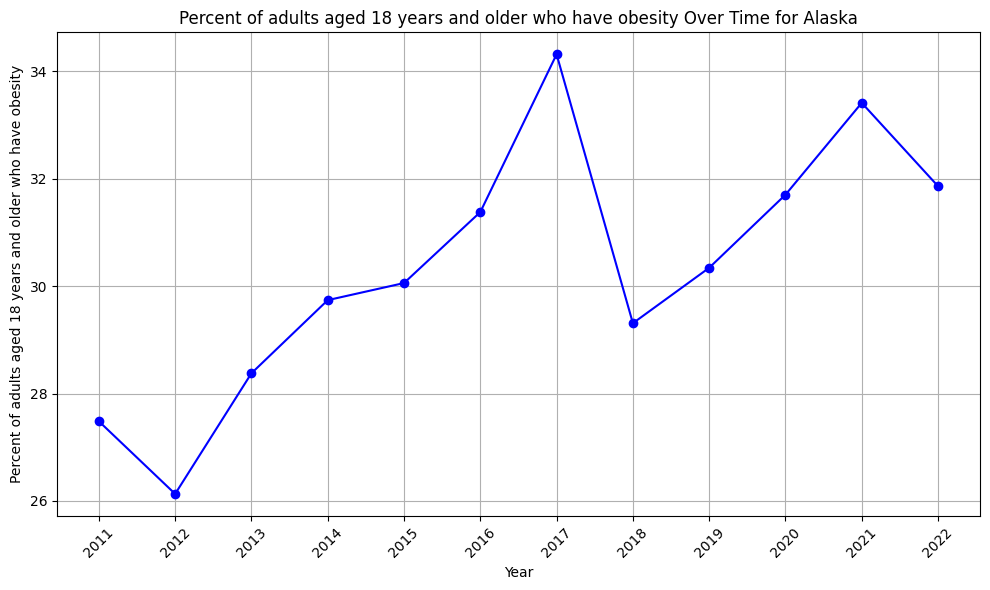

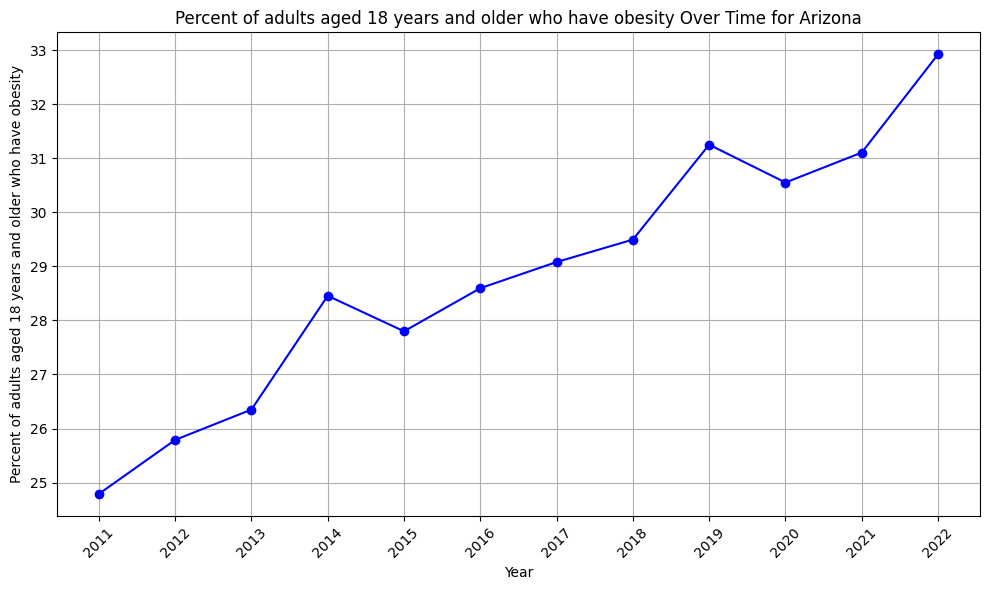

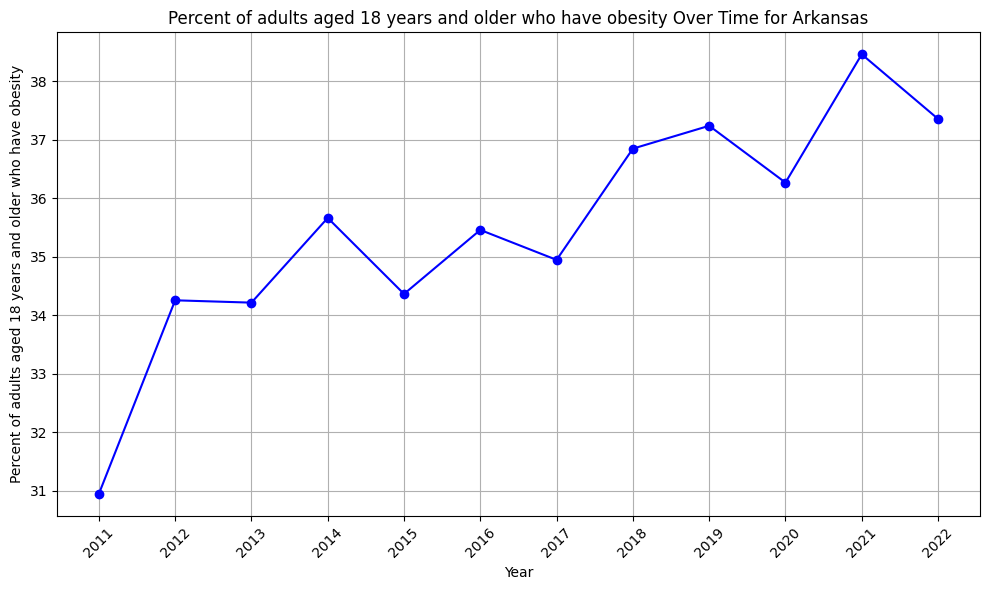

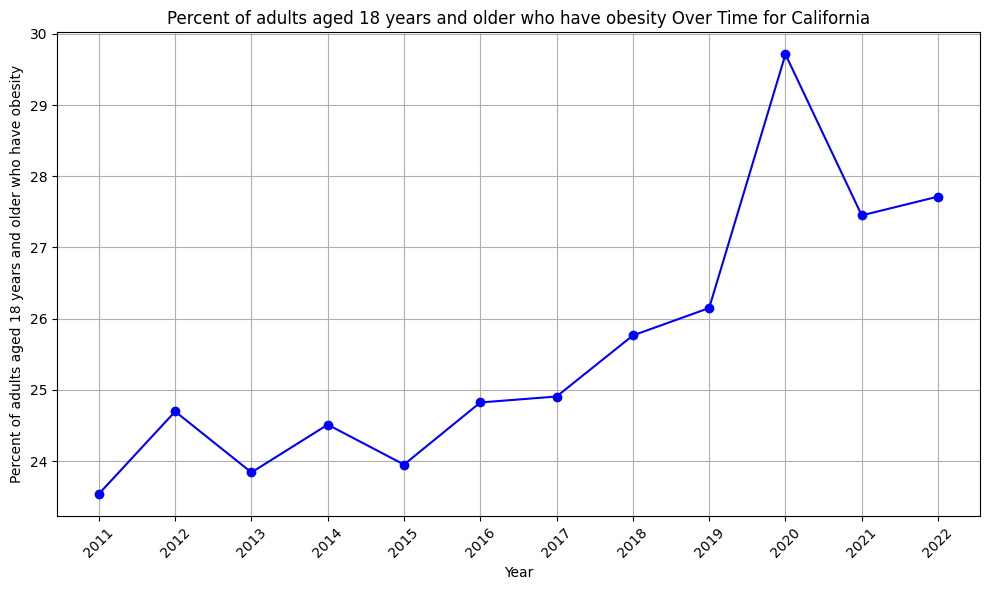

...

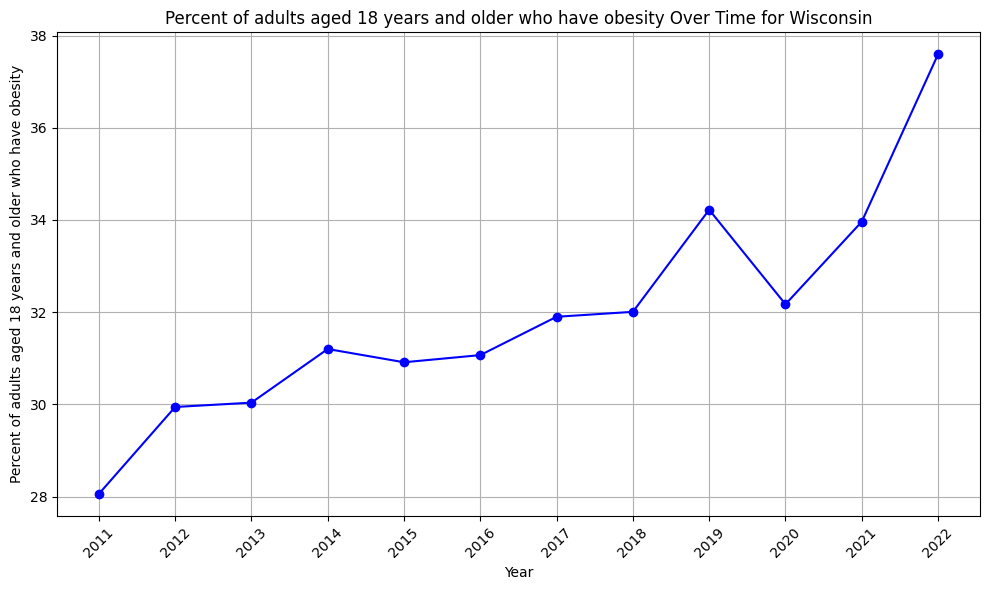

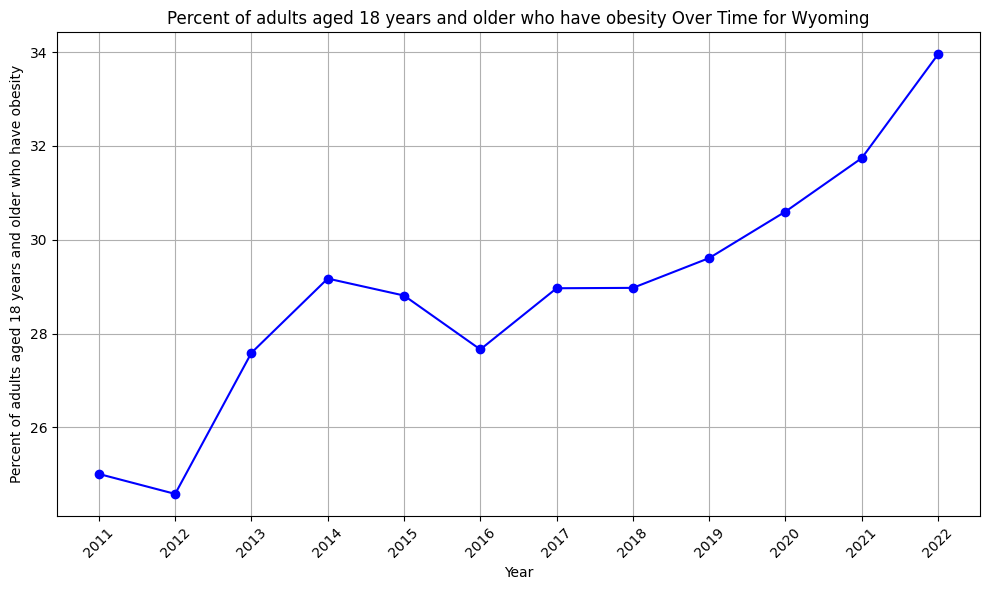

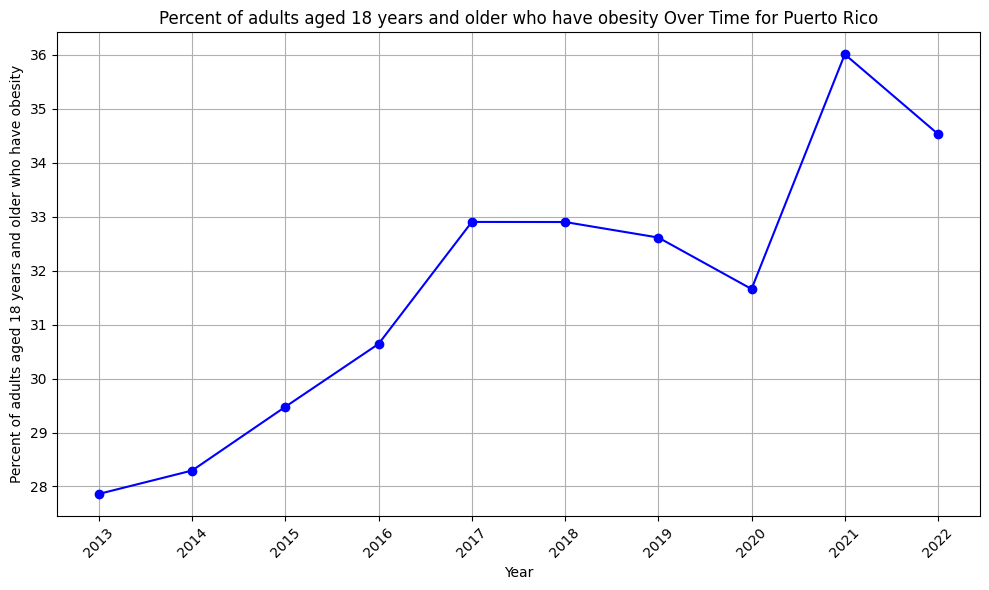

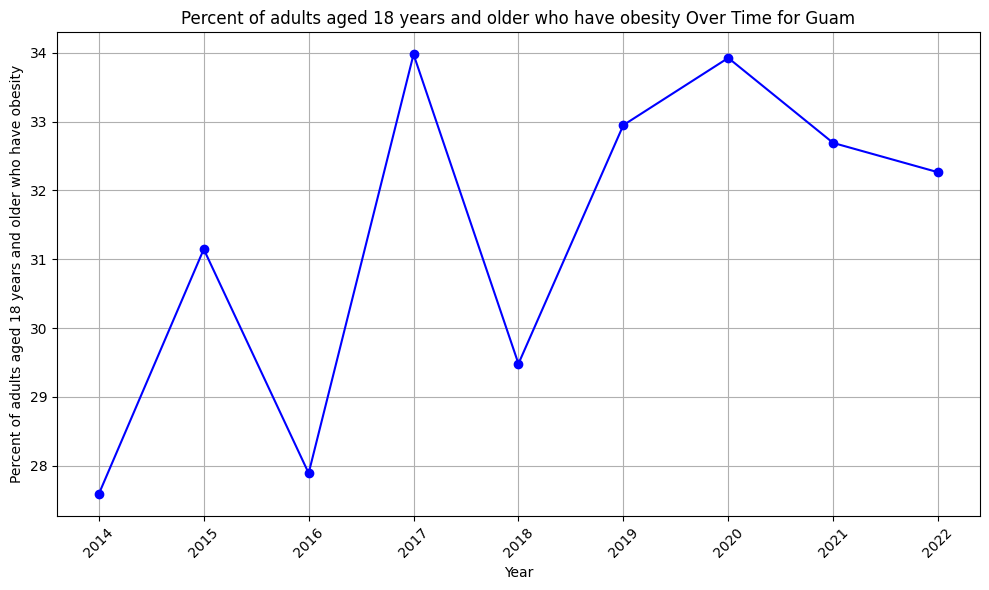

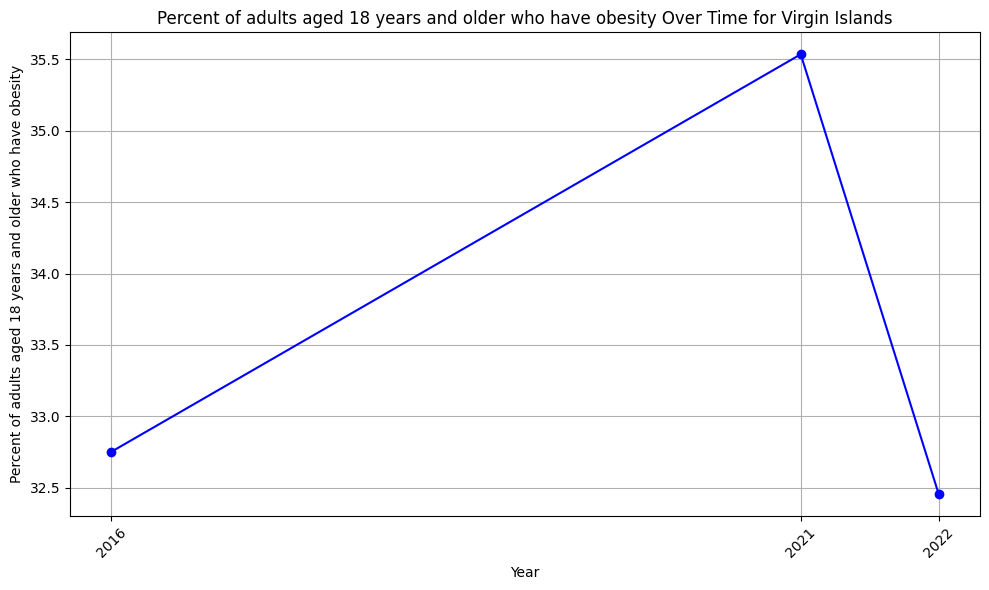

In [43]:
plot_for_all_states(grouped3_df, 'Percent of adults aged 18 years and older who have obesity')

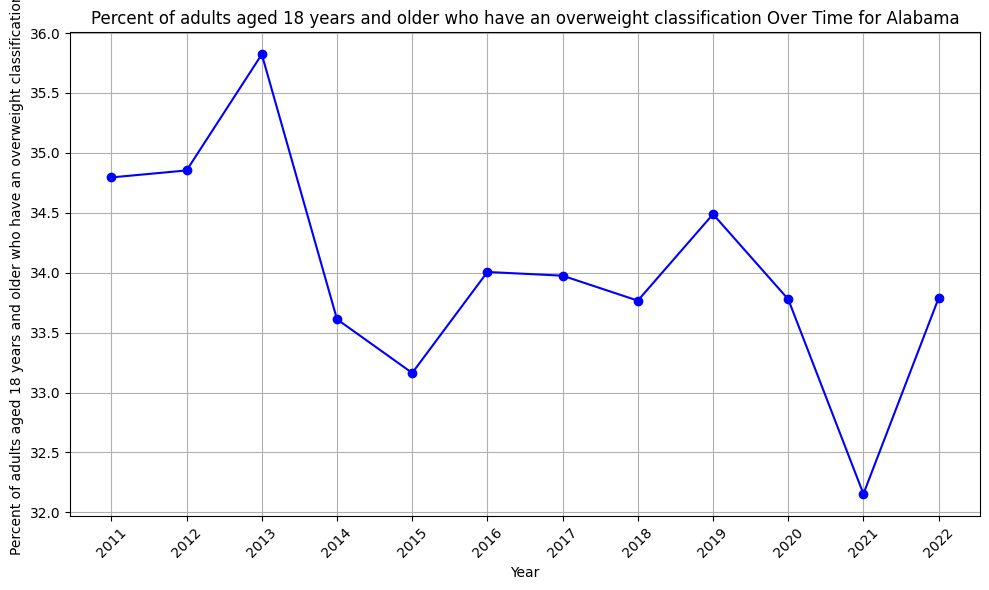

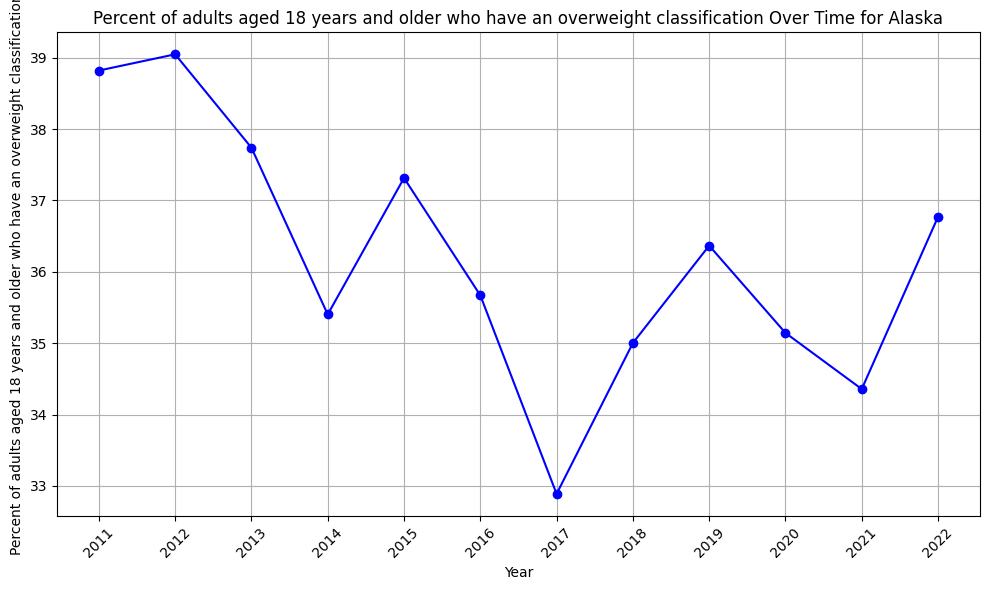

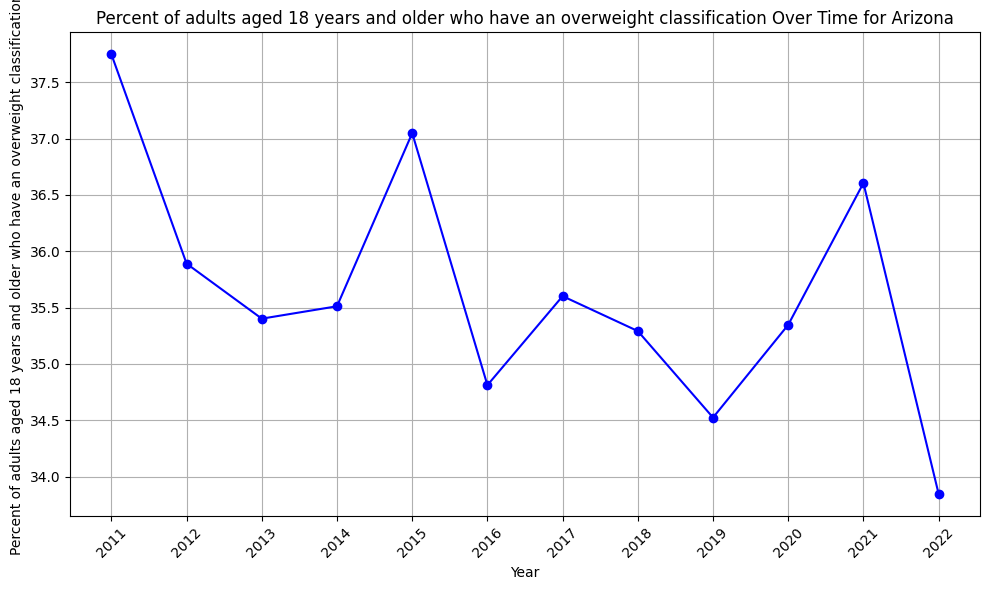

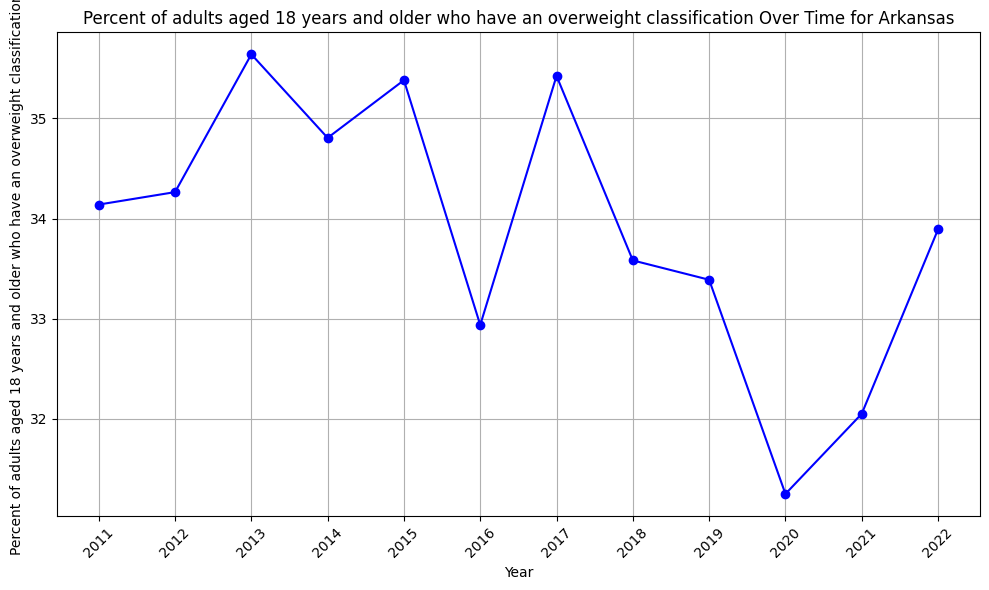

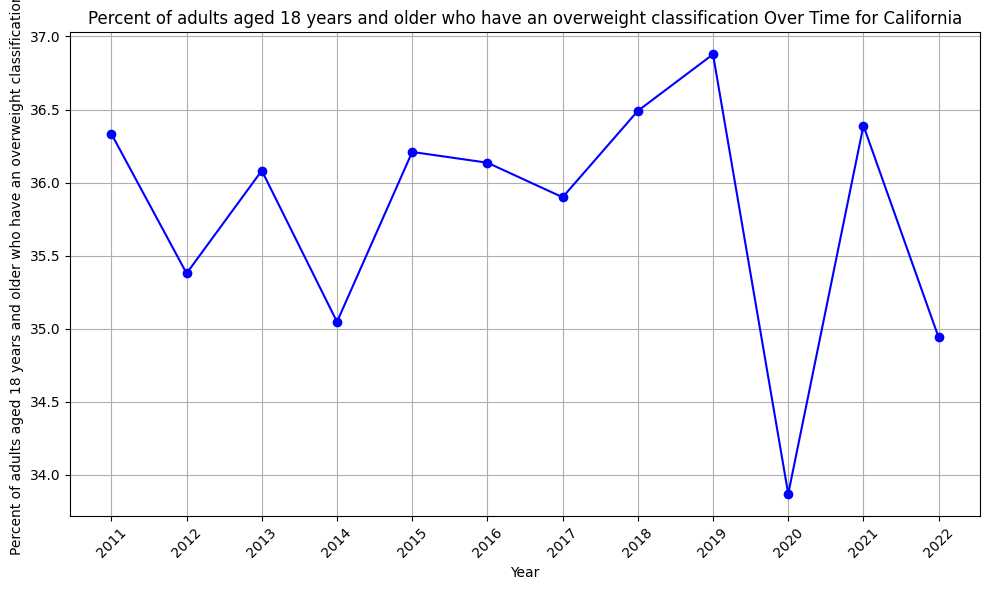

...

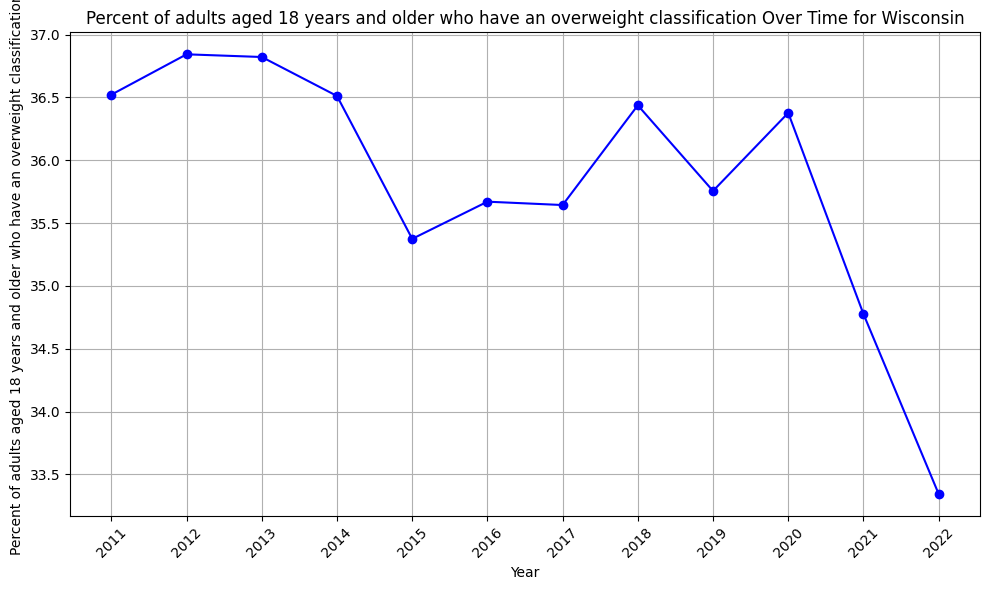

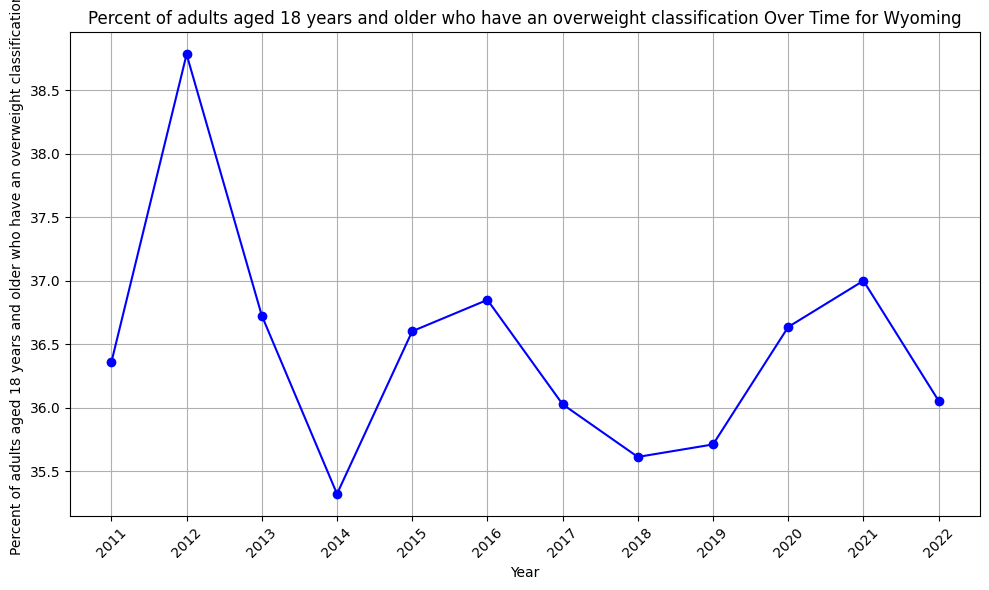

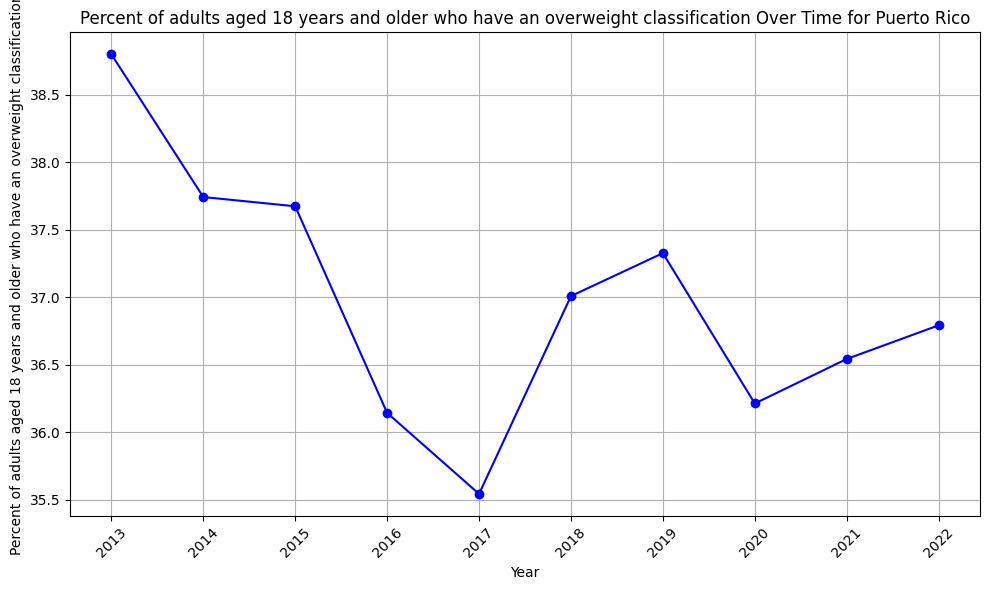

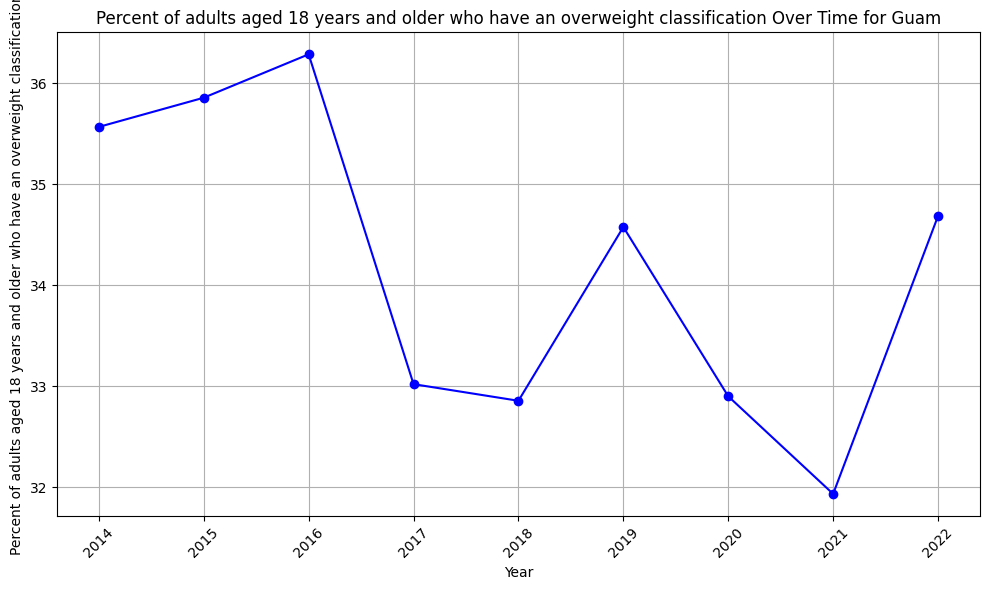

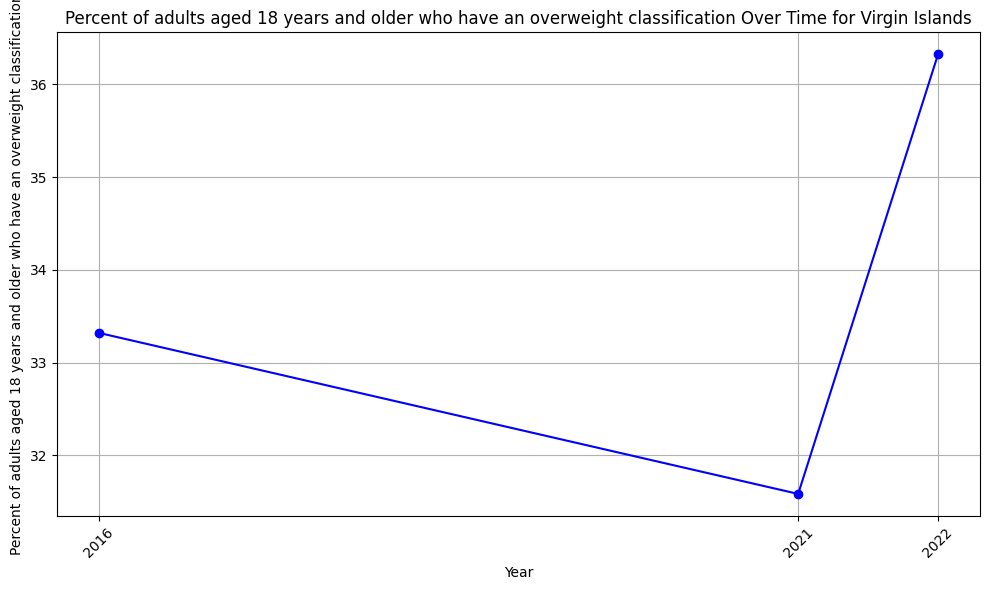

In [44]:
plot_for_all_states(grouped4_df, 'Percent of adults aged 18 years and older who have an overweight classification')